### Deep Fake Detection
### Detect Whether a Given Video is Fake Video or Real Video
### Data Set Downloaded from Kaggle DFDC Challenge

## 1. Import Necessary Libraries
## For this project i used : Face-Recognition , Open CV Libraries

In [7]:
import cv2
import numpy as np
import face_recognition
import math
import matplotlib.pyplot as plt

%matplotlib inline
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing import image   # for preprocessing the images
import numpy as np    # for mathematical operations
from tensorflow.keras.utils import to_categorical 
from skimage.transform import resize   # for resizing images

In [4]:
videoFile = "/Users/klrao/Downloads/1-Dissertation-DeepFake/train_sample_videos/etmcruaihe.mp4"
outpath = "/Users/klrao/Downloads/1-Dissertation-DeepFake/train_sample_videos/OutputFrames/"

## 2. Capture the Video

In [9]:
count = 0
cap = cv2.VideoCapture(videoFile)   # capturing the video from the given path
frameRate = cap.get(5) #frame rate
print("frameRate",frameRate)
x=1

frameRate 29.969


## 3. Converting Videos to Image Frames

In [10]:
while(cap.isOpened()):
    frameId = cap.get(1) #current frame number
    ret, frame = cap.read()
    if (ret != True):
        break
    if (frameId % math.floor(frameRate) == 0):
        filename = outpath + "frame%d.jpg" % count;count+=1
        cv2.imwrite(filename, frame)
cap.release()
print ("Done!")


Done!


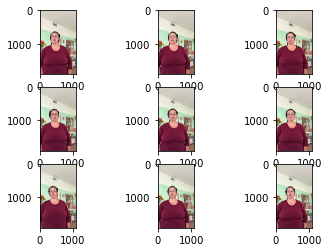

In [21]:
count=0

for i in range(9):
    # define subplot
    #plt.figsize(15,15)
    plt.subplot( 330+i+1)
    # plot raw pixel data
    img = plt.imread(outpath +"frame%d.jpg" % count)   # reading image using its name
    count+=1
    plt.imshow(img)
    #pyplot.imshow(batch3_data[i])
# show the figure
plt.show()

## 4. Code to Play Videos in Notebook

In [6]:
from IPython.display import HTML
from base64 import b64encode

In [2]:
DATA_FOLDER = '/Users/klrao/Downloads/1-Dissertation-DeepFake/'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
import os
def play_video(video_file, subset=TRAIN_SAMPLE_FOLDER):
    '''
    Display video
    param: video_file - the name of the video file to display
    param: subset - the folder where the video file is located (can be TRAIN_SAMPLE_FOLDER or TEST_Folder)
    '''
    video_url = open(os.path.join(DATA_FOLDER, subset,video_file),'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" % data_url)

In [27]:
play_video("etmcruaihe.mp4")

##  5.  Capture Videos
####        Extract Frame
####        Add Bounding Boxes to Faces
####        Add Bounding Boxes to Eyes

In [28]:
import timeit
import time
import tqdm
count = 0
cap = cv2.VideoCapture(videoFile)   # capturing the video from the given path
length = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

fourcc = cv2.VideoWriter_fourcc(*'MJPG')
output_movie = cv2.VideoWriter('/Users/klrao/Downloads/1-Dissertation-DeepFake/train_sample_videos/output_etmcruaihe1.avi', fourcc, 29.97, (640, 360))


frameRate = cap.get(5) #frame rate
print("frameRate",frameRate)
x=1
c = 0
#def generator():
frame_number = 0  
#    yield
start = time.time()  
print(start)
frames = []

#for _ in cap.isOpened():
while((cap.isOpened())):
    frameId = cap.get(1) #current frame number
    ret, frame = cap.read()
    frame_number+=1
    
   
    if(frame_number+1 < 300):
        height, width, layers = frame.shape
        size = (width,height)
        print('Shape',frame.shape)
        face_locations = face_recognition.face_locations(frame)
        for top, right, bottom, left in face_locations:
        
            # Draw a box around the face
            cv2.rectangle(frame, (left, top), (right, bottom), (0, 0, 255), 2)

            # Draw a label with a name below the face
            cv2.rectangle(frame, (left, bottom - 25), (right, bottom), (0, 0, 255), cv2.FILLED)
            font = cv2.FONT_HERSHEY_DUPLEX
            cv2.putText(frame, "name", (left + 6, bottom - 6), font, 0.5, (255, 255, 255), 1)
    
        face_landmarks_list = face_recognition.face_landmarks(frame)
        for face_landmark in face_landmarks_list:
            left_eye = face_landmark['left_eye']
            right_eye = face_landmark['right_eye']
            
            color = (255,0,0)
            thickness = 2

            cv2.rectangle(frame, left_eye[0], right_eye[-1], color, thickness)
    
    if (ret != True):
        print(frameId,ret)
        break
    '''if (frameId % math.floor(frameRate) == 0):
        print(c)
        filename = outpath + "frame%d.jpg" % count;count+=1
        cv2.imwrite(filename, frame)
    '''
    print("Writing frame {} / {}".format(frame_number, length))
    #print(frame)
    frames.append(frame)
    
#output_movie.write(frames)    
#cap.release()
print ("Done!")
end = time.time()
print(end)
print("Time",end - start)

frameRate 29.969
1621832688.4322538
Shape (1920, 1080, 3)
Writing frame 1 / 300
Shape (1920, 1080, 3)
Writing frame 2 / 300
Shape (1920, 1080, 3)
Writing frame 3 / 300
Shape (1920, 1080, 3)
Writing frame 4 / 300
Shape (1920, 1080, 3)
Writing frame 5 / 300
Shape (1920, 1080, 3)
Writing frame 6 / 300
Shape (1920, 1080, 3)
Writing frame 7 / 300
Shape (1920, 1080, 3)
Writing frame 8 / 300
Shape (1920, 1080, 3)
Writing frame 9 / 300
Shape (1920, 1080, 3)
Writing frame 10 / 300
Shape (1920, 1080, 3)
Writing frame 11 / 300
Shape (1920, 1080, 3)
Writing frame 12 / 300
Shape (1920, 1080, 3)
Writing frame 13 / 300
Shape (1920, 1080, 3)
Writing frame 14 / 300
Shape (1920, 1080, 3)
Writing frame 15 / 300
Shape (1920, 1080, 3)
Writing frame 16 / 300
Shape (1920, 1080, 3)
Writing frame 17 / 300
Shape (1920, 1080, 3)
Writing frame 18 / 300
Shape (1920, 1080, 3)
Writing frame 19 / 300
Shape (1920, 1080, 3)
Writing frame 20 / 300
Shape (1920, 1080, 3)
Writing frame 21 / 300
Shape (1920, 1080, 3)
Writin

Writing frame 181 / 300
Shape (1920, 1080, 3)
Writing frame 182 / 300
Shape (1920, 1080, 3)
Writing frame 183 / 300
Shape (1920, 1080, 3)
Writing frame 184 / 300
Shape (1920, 1080, 3)
Writing frame 185 / 300
Shape (1920, 1080, 3)
Writing frame 186 / 300
Shape (1920, 1080, 3)
Writing frame 187 / 300
Shape (1920, 1080, 3)
Writing frame 188 / 300
Shape (1920, 1080, 3)
Writing frame 189 / 300
Shape (1920, 1080, 3)
Writing frame 190 / 300
Shape (1920, 1080, 3)
Writing frame 191 / 300
Shape (1920, 1080, 3)
Writing frame 192 / 300
Shape (1920, 1080, 3)
Writing frame 193 / 300
Shape (1920, 1080, 3)
Writing frame 194 / 300
Shape (1920, 1080, 3)
Writing frame 195 / 300
Shape (1920, 1080, 3)
Writing frame 196 / 300
Shape (1920, 1080, 3)
Writing frame 197 / 300
Shape (1920, 1080, 3)
Writing frame 198 / 300
Shape (1920, 1080, 3)
Writing frame 199 / 300
Shape (1920, 1080, 3)
Writing frame 200 / 300
Shape (1920, 1080, 3)
Writing frame 201 / 300
Shape (1920, 1080, 3)
Writing frame 202 / 300
Shape (192

In [31]:
print(size)

(1080, 1920)


## 6. Write Frames to Output Video

In [34]:
#height, width, layers = frame.shape
out = cv2.VideoWriter(outpath+'project_face_eye.mp4',cv2.VideoWriter_fourcc(*'DIVX'), 15, size)
 
for i in range(len(frames)):
    out.write(frames[i])
out.release()

In [35]:
print(face_locations)

[(762, 538, 985, 315)]


In [7]:
play_video(outpath+'project_face_eye.mp4')

In [39]:
os.chdir(outpath)
os.listdir()

['.DS_Store',
 'project_face_eye.mp4',
 'frame9.jpg',
 'frame8.jpg',
 'frame5.jpg',
 'frame10.jpg',
 'frame4.jpg',
 'frame6.jpg',
 'frame7.jpg',
 'frame3.jpg',
 'frame2.jpg',
 'frame0.jpg',
 'frame1.jpg',
 'project_face_eye.avi',
 'project.avi']

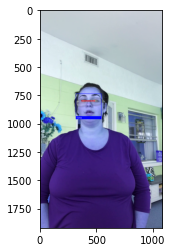

In [51]:
plt.imshow(frames[2])
plt.imshow(frames[3])

In [58]:
X = np.array(frames)



In [60]:
X.shape

(300, 1920, 1080, 3)